In [1]:
from sklearn.datasets import fetch_openml

mnist = fetch_openml('mnist_784')
X = mnist.data.astype('float64')
y = mnist.target.astype('int64')

In [2]:
from sklearn.decomposition import PCA
pca_2d = PCA(n_components=2)
X_pca_2d = pca_2d.fit_transform(X)

pca_3d = PCA(n_components=3)
X_pca_3d = pca_3d.fit_transform(X)

In [3]:
print('Dimensões antes do PCA-3D:', X.shape)
print('Dimensões após PCA-3D:', X_pca_3d.shape)

Dimensões antes do PCA-3D: (70000, 784)
Dimensões após PCA-3D: (70000, 3)


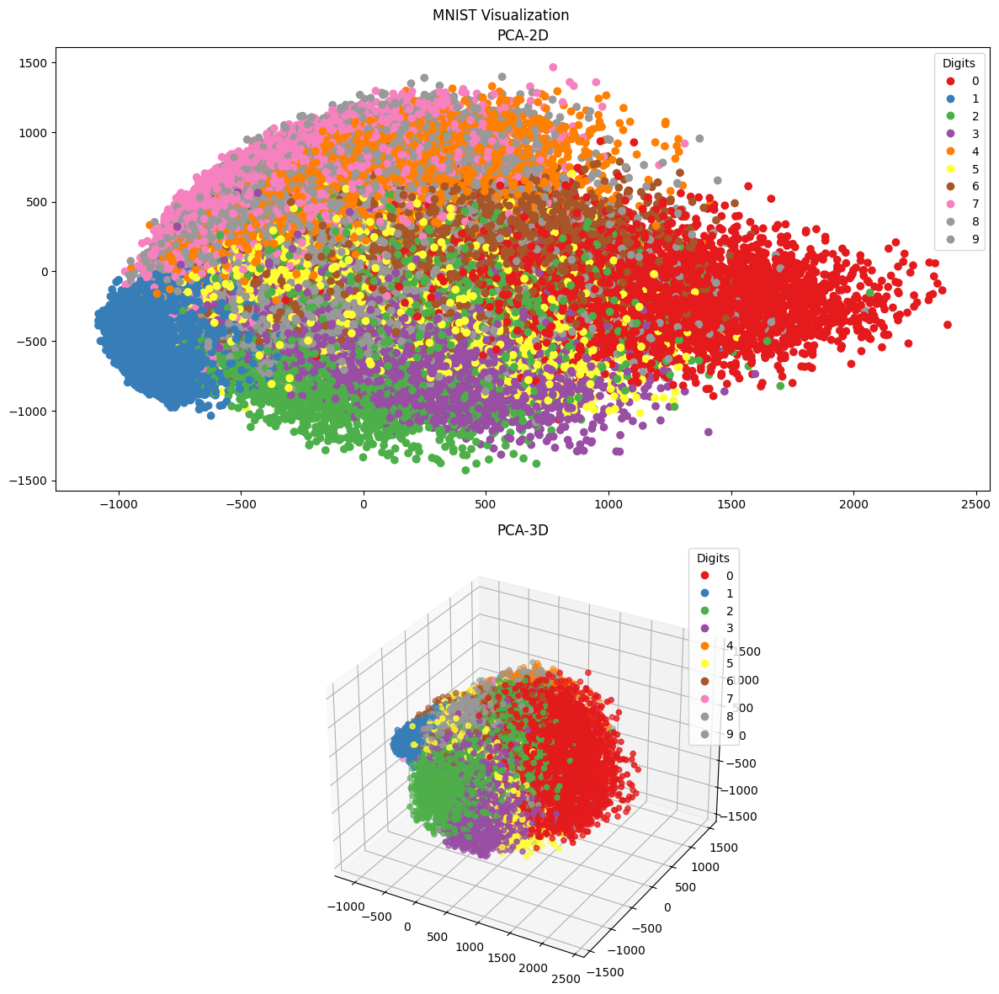

In [4]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure(figsize=(12, 12))
fig.suptitle('MNIST Visualization')

# Plot the 2D projection
ax1 = fig.add_subplot(211)
ax1.title.set_text('PCA-2D')
scatter1 = ax1.scatter(X_pca_2d[:, 0], X_pca_2d[:, 1], c=y, cmap='Set1')
legend1 = ax1.legend(*scatter1.legend_elements(), title='Digits')

# Plot the 3D projection
ax2 = fig.add_subplot(212, projection='3d')
ax2.title.set_text('PCA-3D')
scatter2 = ax2.scatter(X_pca_3d[:, 0], X_pca_3d[:, 1], X_pca_3d[:, 2], c=y, cmap='Set1')
legend2 = ax2.legend(*scatter2.legend_elements(), title='Digits')

plt.tight_layout()
plt.show()


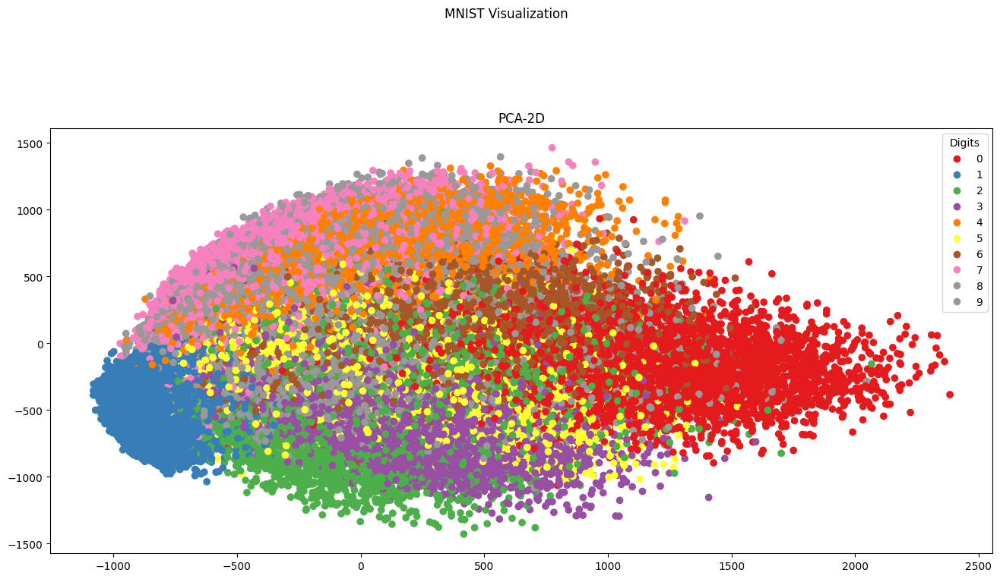

In [5]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import plotly.graph_objects as go
import plotly.colors

fig = plt.figure(figsize=(16, 16))
fig.suptitle('MNIST Visualization')

# Plot the 2D projection
ax1 = fig.add_subplot(211)
ax1.title.set_text('PCA-2D')
scatter1 = ax1.scatter(X_pca_2d[:, 0], X_pca_2d[:, 1], c=y, cmap='Set1')
legend1 = ax1.legend(*scatter1.legend_elements(), title='Digits')

# Create an interactive 3D plot using plotly
colorscale = plotly.colors.qualitative.Set1
fig3d = go.Figure(data=[go.Scatter3d(x=X_pca_3d[:, 0], y=X_pca_3d[:, 1], z=X_pca_3d[:, 2],
                                    mode='markers', marker=dict(color=y, colorscale=colorscale),
                                    text=y, hovertemplate='%{text}')])
fig3d.update_layout(title='PCA-3D', width=800, height=800)
fig3d.show()



In [6]:
print(pca_2d.explained_variance_ratio_)

[0.09746116 0.07155445]


In [7]:
print(pca_3d.explained_variance_ratio_)

[0.09746116 0.07155445 0.06149531]


In [8]:
from sklearn.decomposition import PCA
pca_xd = PCA(n_components=0.98)
X_pca_xd = pca_xd.fit_transform(X)

print('Dimensões PCA:', X_pca_xd.shape)
print(pca_xd.explained_variance_ratio_)

Dimensões PCA: (70000, 260)
[0.09746116 0.07155445 0.06149531 0.05403385 0.04888934 0.04305227
 0.03278262 0.02889642 0.02758364 0.0234214  0.02106689 0.02037553
 0.01707064 0.0169402  0.01583382 0.01486345 0.01319358 0.01279014
 0.01187272 0.01152937 0.0106604  0.01009794 0.00959151 0.00909635
 0.00883287 0.00838818 0.00809832 0.00785718 0.00740262 0.00690014
 0.00656144 0.0064547  0.00600819 0.00585612 0.00566754 0.00543471
 0.00504717 0.00487079 0.00478955 0.00467594 0.00454369 0.00444918
 0.00418217 0.00396164 0.00383708 0.00375785 0.00361426 0.00349025
 0.00338732 0.00319696 0.00316854 0.00310145 0.0029648  0.00287101
 0.00282514 0.00269423 0.00268392 0.00256509 0.00253168 0.00244648
 0.00239702 0.00238581 0.00229234 0.00220949 0.0021306  0.00206317
 0.00202781 0.00195035 0.00191471 0.0018855  0.00186976 0.00180104
 0.00176787 0.00173359 0.00164849 0.00163237 0.00161408 0.00154304
 0.0014702  0.00142199 0.00141016 0.00140146 0.00139605 0.00135025
 0.00132371 0.00131893 0.00129197 

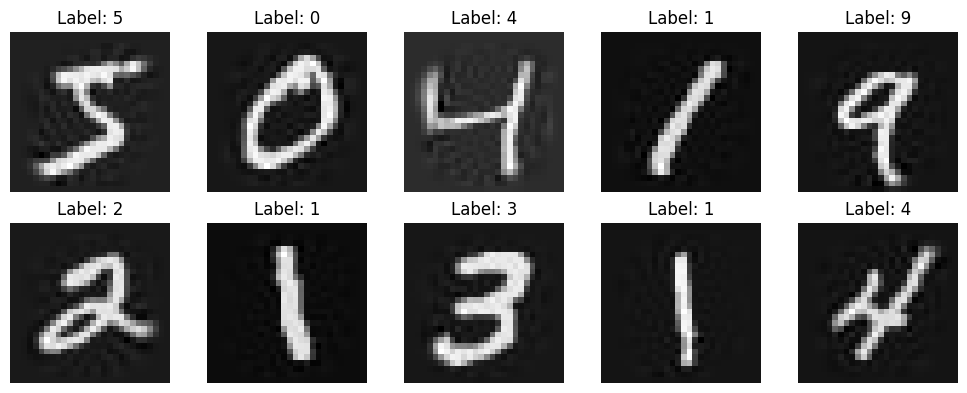

In [9]:
# Inverter a transformação do PCA para obter as imagens originais
X_restored = pca_xd.inverse_transform(X_pca_xd)

# Plotar alguns exemplos
fig, axes = plt.subplots(2, 5, figsize=(10, 4))
for i, ax in enumerate(axes.flat):
    ax.imshow(X_restored[i].reshape(28, 28), cmap='gray')
    ax.set_title(f'Label: {y[i]}')
    ax.axis('off')

plt.tight_layout()
plt.show()


In [10]:
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split
from sklearn.svm import LinearSVC
from sklearn.metrics import accuracy_score

# Dividir o conjunto de dados em treino e teste
X_train, X_test, y_train, y_test = train_test_split(X_pca_xd, y, test_size=0.2, random_state=42)

# Treinar um modelo de Regressão Logística
model = LinearSVC()
model.fit(X_train, y_train)

# Fazer previsões no conjunto de teste
y_pred = model.predict(X_test)

# Calcular a acurácia do modelo
accuracy = accuracy_score(y_test, y_pred)
print(f'Acurácia: {accuracy:.4f}')


c:\Users\erikp\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\svm\_classes.py:31: FutureWarning:

The default value of `dual` will change from `True` to `'auto'` in 1.5. Set the value of `dual` explicitly to suppress the warning.



In [ ]:
import numpy as np
from sklearn import datasets
from sklearn.manifold import TSNE
import plotly.graph_objects as go

# Carregar o conjunto de dados MNIST
mnist = datasets.load_digits()
X = mnist.data
y = mnist.target

# Aplicar o t-SNE aos dados
tsne = TSNE(n_components=3, random_state=42)
X_tsne = tsne.fit_transform(X)

# Criar um gráfico 3D interativo
fig = go.Figure(data=go.Scatter3d(
    x=X_tsne[:, 0],
    y=X_tsne[:, 1],
    z=X_tsne[:, 2],
    mode='markers',
    marker=dict(
        size=5,
        color=y,
        colorscale='Viridis',
        opacity=0.8
    )
))

# Definir rótulos para os pontos
hover_text = [f"Label: {label}" for label in y]
fig.data[0].text = hover_text

# Configurar o layout do gráfico
fig.update_layout(
    title='t-SNE em MNIST (Gráfico 3D)',
    scene=dict(
        xaxis=dict(title='Componente 1'),
        yaxis=dict(title='Componente 2'),
        zaxis=dict(title='Componente 3'),
    )
)

# Exibir o gráfico interativo
fig.show()
